In [4]:
%matplotlib notebook
# %matplotlib widget
import numpy as np

In [6]:
## Unique matrix for Cos^2(x)
N = 11
C_mat = np.zeros((N, N))
C_mat += np.diag(0.5*np.ones(N), 0) + np.diag(0.25 * np.ones(N-2), -2) + np.diag(0.25 * np.ones(N-2), 2) 
C_mat[0,-2] = C_mat[-2,0] = C_mat[1, -1] = C_mat[-1, 1] =  0.25
C_mat

array([[0.5 , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.25, 0.  ],
       [0.  , 0.5 , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.25],
       [0.25, 0.  , 0.5 , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.25, 0.  , 0.5 , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.25, 0.  , 0.5 , 0.  , 0.25, 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.25, 0.  , 0.5 , 0.  , 0.25, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.25, 0.  , 0.5 , 0.  , 0.25, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.25, 0.  , 0.5 , 0.  , 0.25, 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.25, 0.  , 0.5 , 0.  , 0.25],
       [0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.25, 0.  , 0.5 , 0.  ],
       [0.  , 0.25, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.25, 0.  , 0.5 ]])

## $Cos^2(x)$

## Main Code for final submission

0.5585589408874512


<IPython.core.display.Javascript object>


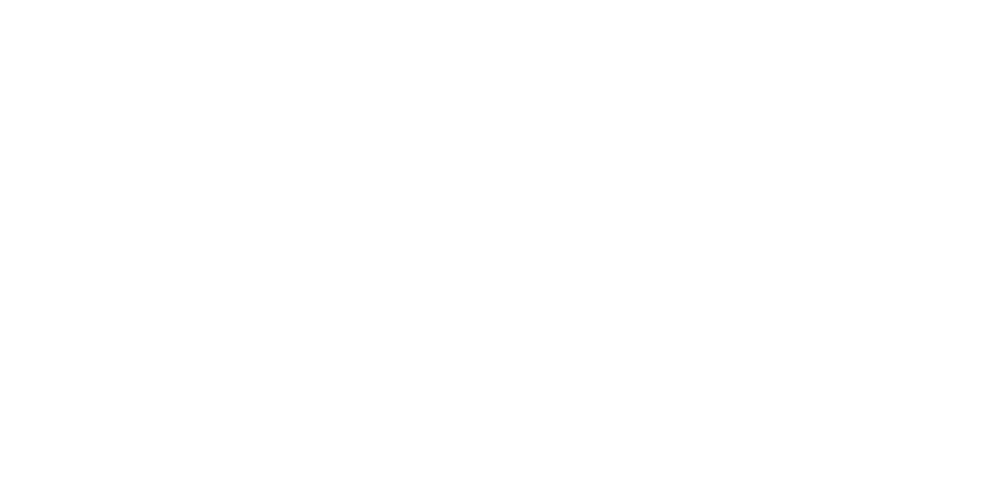

/tmp/ipykernel_111383/46207516.py:86: MatplotlibDeprecationWarning: The close_event function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use callbacks.process('close_event', CloseEvent(...)) instead.
  plt.close(fig)


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import time
## real space 
N = 256
L = 2*np.pi
x = np.linspace(0, L, N, endpoint=False)
dx = x[1] - x[0]

## time
T = 2.0
Nt = 1000          
dt = T / Nt
eps = 1e-12                    ## not needed

## k (fourier space discretization)
k = np.fft.fftfreq(N, d=L/N) * 2*np.pi
k2 = k**2
K_mat = np.diag(k2)  

t0 = time.time()
## C_Mat matrix for cos^2(x) asmy velocity
C_mat = np.zeros((N, N), dtype=float)
C_mat = np.zeros((N, N))
C_mat += np.diag(0.5*np.ones(N), 0) + np.diag(0.25 * np.ones(N-2), -2) + np.diag(0.25 * np.ones(N-2), 2)

## BC
C_mat[0,-2] = C_mat[-2,0] = C_mat[1, -1] = C_mat[-1, 1] =  0.25


## Inital cond f(x, t=0) and f'(x, t=0) = 0 
f0 = np.sin(x)**2
f_hat0 = np.fft.fft(f0)         ## intial cond in fourier space

## f_xx via spectral derivative
f_xx0 = np.fft.ifft(-k2 * np.fft.fft(f0)).real
f_tt0 = (np.cos(x)**2) * f_xx0           # f_tt = cos^2 * f_xx
f1 = f0 + 0.5 * dt**2 * f_tt0   ## term required for implicit scheme
f_hat1 = np.fft.fft(f1)         ## in fourier space

## to store the wave solution at different time steps
all_f_hat = np.zeros((Nt+2, N), dtype=complex)
all_f_hat[0] = f_hat0
all_f_hat[1] = f_hat1

## A = (C + dt^2 * K_mat)
# A = C_mat + (dt**2) * K_mat + eps * np.eye(N)
A = C_mat + (dt**2) * K_mat 
A_inv = np.linalg.inv(A)        ## inverse to solve linear equation at different time steps

# time stepping loop (implicit sceheme)
for n in range(1, Nt+1):
    rhs = 2 * (C_mat @ all_f_hat[n]) - (C_mat @ all_f_hat[n-1])
    f_hat_next = A_inv @ rhs    ## A_inv already calculated
    all_f_hat[n+1] = f_hat_next

# to being back the wave soltion to real space
all_fs = np.fft.ifft(all_f_hat, axis=1).real
t1 = time.time()
print(t1-t0)


# Plotting 
fig, ax = plt.subplots(figsize=(8,4))
line, = ax.plot(x, all_fs[0], lw=2)
ax.set_xlim(0, L)
ax.set_ylim(-0.5, 1.5)
ax.set_xlabel("$x$", fontsize = 16)
ax.set_ylabel("$f(x,t)$", fontsize = 16)
ax.tick_params(axis='both',
               which='major',
               labelsize=18,     
               length=10,        
               width=2,          
               direction='inout')
def update(frame):
    line.set_ydata(all_fs[frame])
    ax.set_title(f"$t$ = {frame*dt:.4f}", fontsize = 16)
    return line,

frame_idx = np.arange(0, Nt+2, max(1, (Nt+2)//500))
anim = FuncAnimation(fig, update, frames=frame_idx, interval=30, blit=True)

anim.save('wave_evolution.gif', writer='pillow', fps=30, dpi = 300)

plt.close(fig)
display(HTML(anim.to_jshtml()))

In [ ]:
k = np.fft.fftfreq(N, d=L/N) * 2*np.pi
k

## Spectral vs. FDM

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML
import time
# Parameters
N = 256
L = 2*np.pi
x = np.linspace(0, L, N, endpoint=False)
dx = x[1]-x[0]

T = 2.0
Nt = 1000
dt = T / Nt
eps = 1e-12

c_x = np.cos(x)**2   # coefficient

# implicit spectral C
C_mat_modal = np.zeros((N,N))
C_mat_modal += np.diag(0.5*np.ones(N), 0)
C_mat_modal += np.diag(0.25*np.ones(N-2), 2)
C_mat_modal += np.diag(0.25*np.ones(N-2), -2)
C_mat_modal[0,-2] = C_mat_modal[1,-1] = 0.25
C_mat_modal[-2,0] = C_mat_modal[-1,1] = 0.25

## K matrix

kvec = np.fft.fftfreq(N, d=L/N) * 2*np.pi
k2 = kvec**2
K_modal = np.diag(k2)

## initialization

f0 = np.sin(x)**2
f_hat0 = np.fft.fft(f0)
rhs0 = -(K_modal @ f_hat0)
a0_modal = np.linalg.solve(C_mat_modal + eps*np.eye(N), rhs0)
f_hat1 = f_hat0 + 0.5 * dt**2 * a0_modal

A_modal = C_mat_modal + (dt**2) * K_modal + eps*np.eye(N)
A_modal_inv  = np.linalg.inv(A_modal)

## storing
all_f_hat_modal = np.zeros((Nt+2, N), dtype=complex)
all_f_hat_modal[0] = f_hat0
all_f_hat_modal[1] = f_hat1

## implict spectral timestepping loop
t0 = time.time()
for n in range(1, Nt+1):
    rhs = 2*(C_mat_modal @ all_f_hat_modal[n]) - (C_mat_modal @ all_f_hat_modal[n-1])
#     f_hat_next = np.linalg.solve(A_modal, rhs)
    f_hat_next = A_modal_inv @ rhs
    all_f_hat_modal[n+1] = f_hat_next
t1 = time.time()
print("Spectral (modal) time:", t1 - t0, "seconds")


all_fs_modal = np.fft.ifft(all_f_hat_modal, axis=1).real

# implict FDM 
D2 = np.zeros((N,N))
for i in range(N):
    D2[i, (i-1)%N] = 1.0
    D2[i, i] = -2.0
    D2[i, (i+1)%N] = 1.0
D2 /= dx**2

DiagC = np.diag(c_x)
# A_fdm = DiagC / (dt**2) - D2 + eps*np.eye(N)
A_fdm = DiagC / (dt**2) - D2 
A_fdm_inv = np.linalg.inv(A_fdm)

rhs_f = D2 @ f0
f_tt0 = np.linalg.solve(DiagC + eps*np.eye(N), rhs_f)
f1_fdm = f0 + 0.5 * dt**2 * f_tt0

all_f_fdm = np.zeros((Nt+2, N))
all_f_fdm[0] = f0.copy()
all_f_fdm[1] = f1_fdm.copy()

t2 = time.time()
for n in range(1, Nt+1):
    rhs = DiagC @ (2*all_f_fdm[n] - all_f_fdm[n-1]) / (dt**2)
#     f_next = np.linalg.solve(A_fdm, rhs)
    f_next = A_fdm_inv @ rhs
    all_f_fdm[n+1] = f_next
t3 = time.time()
print("FDM time:", t3 - t2, "seconds")

## ploting
fig, ax = plt.subplots(figsize=(7, 4))
line1, = ax.plot(x, all_fs_modal[0], lw=2, label='Spectral')
line2, = ax.plot(x, all_f_fdm[0], '--', lw=2, label='FDM')
ax.set_xlim(0, L)
ax.set_ylim(-0.2, 1.5)
ax.set_xlabel("x")
ax.set_ylabel("f(x,t)")
ax.legend()
title = ax.set_title("t = 0.000")

def update(frame):
    line1.set_ydata(all_fs_modal[frame])
    line2.set_ydata(all_f_fdm[frame])
    title.set_text(f"t = {frame*dt:.3f}")
    return line1, line2, title

anim = FuncAnimation(fig, update, frames=range(0, Nt+2, 5), interval=30, blit=True)
# anim.save("spectral_vs_fdm.gif", writer='pillow', fps=20)
plt.close(fig)
display(HTML(anim.to_jshtml()))

Spectral (modal) time: 0.43334245681762695 seconds
FDM time: 0.04932355880737305 seconds
